In [1]:
import skimage
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
import cv2
from skimage import io, exposure, feature, color, filters
from skimage.util import img_as_float
from skimage.filters import gaussian
from skimage.transform import probabilistic_hough_line
from skimage import io, color, feature, transform, util
from plantcv import plantcv as pcv


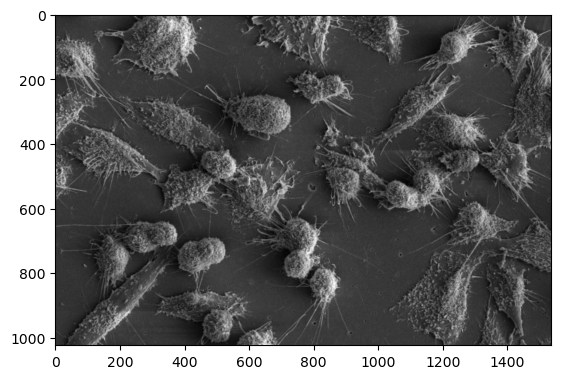

In [2]:
original_image = Image.open("C:/Users/aksha/Peeples_Lab/SEM_Images_Lacunarity/Datasets/Lung Cells SEM Images_group1_DC_NEW/Lung Cells Exposed to Nickel Oxide (NiO)/NiO_Bottom of Insert_DC_02052021_5KV_1200_showing activity_ETD-HV_5_7.png")
image = np.array(original_image)
image = (image/image.max())*255
blurred_image = gaussian(image, sigma=1, mode='reflect')
thresh_nio_image = skimage.filters.threshold_otsu(image)
binary_nio_image = image > thresh_nio_image
# plt.imshow(binary_nio)

plt.imshow(blurred_image, cmap="gray")


In [3]:
original_image_cs = Image.open("C:/Users/aksha/Peeples_Lab/SEM_Images_Lacunarity/Datasets/Lung Cells SEM Images_group1_DC_NEW/Lung Cells Exposed to Crystalline Silica (CS)/CS_DCs_5KV_1200x_ETD_HV_s5.0_13.6WD_012.png")
image_cs = np.array(original_image_cs)
image_cs = (image_cs/image_cs.max())*255


In [4]:
original_image_untreated = Image.open("C:/Users/aksha/Peeples_Lab/SEM_Images_Lacunarity/Datasets/Lung Cells SEM Images_group1_DC_NEW/Lung Cells Untreated/Untreated_DCs_5KV_1200x_ETD_HV_5spot_12.6wd.png")
image_untreated = np.array(original_image_untreated)
image_untreated = (image_untreated/image_untreated.max())*255


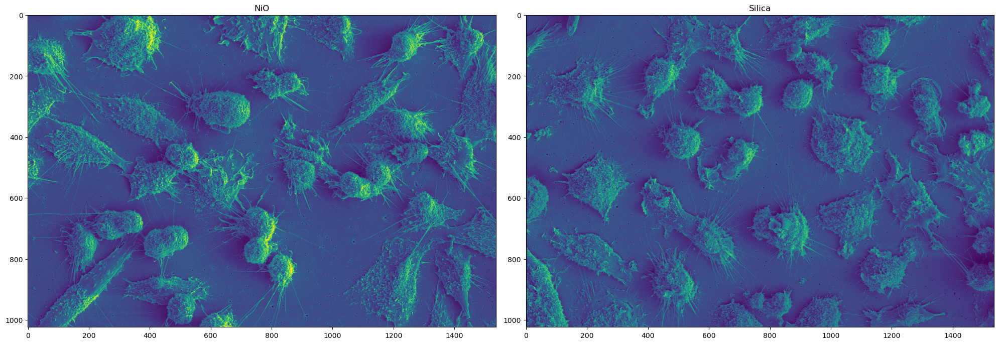

In [5]:

fig, ax = plt.subplots(1,2,figsize=(20, 10))
ax[0].imshow(image)
ax[0].set_title('NiO')

# Second subplot
ax[1].imshow(image_cs)
ax[1].set_title('Silica')

plt.tight_layout()
plt.show()

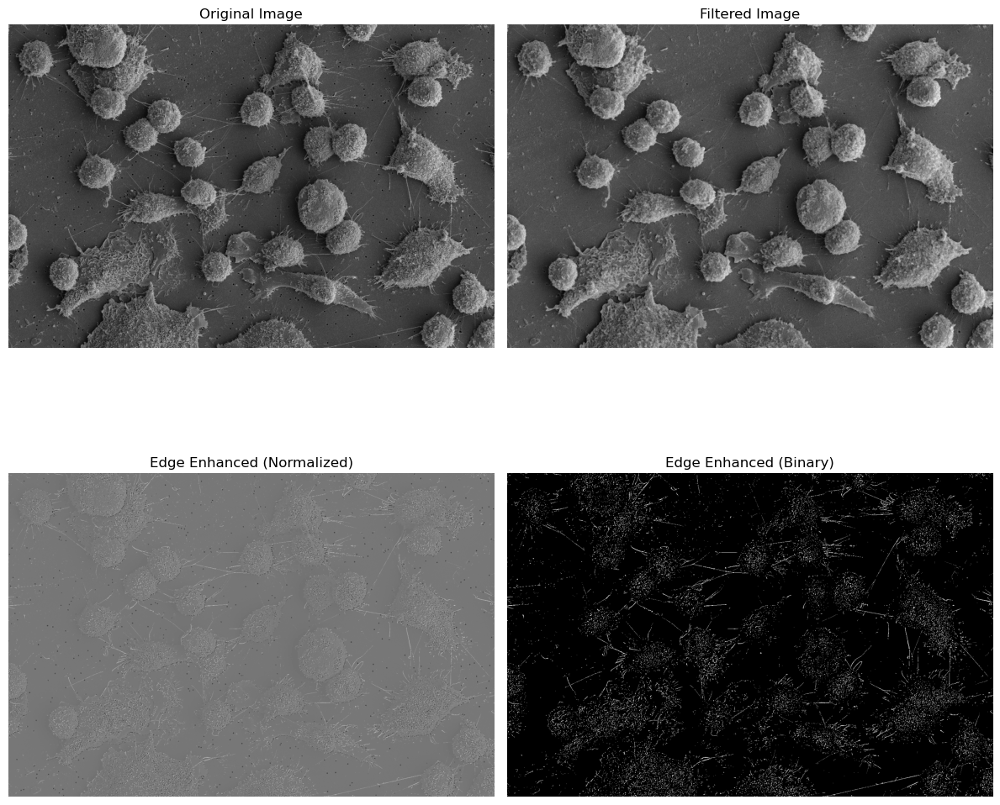

In [6]:
import numpy as np
from skimage import io, filters, morphology
import matplotlib.pyplot as plt

def remove_outliers_skimage(image, radius, threshold, outlier_type='both'):
    """
    Remove outliers from an image using skimage functions.
    
    Parameters:
    image (numpy.ndarray): Input image
    radius (int): Radius of the neighborhood
    threshold (float): Threshold for considering a pixel as an outlier
    outlier_type (str): 'bright' for removing bright outliers, 
                        'dark' for dark outliers, 
                        'both' for both
    
    Returns:
    numpy.ndarray: Image with outliers removed
    """
    # Ensure the image is in the correct format
    image = skimage.img_as_ubyte(image)
    
    # Create a circular structuring element
    selem = morphology.disk(radius)
    
    # Calculate local median
    local_median = filters.rank.median(image, selem)
    
    # Calculate difference from local median
    diff = image.astype(np.int16) - local_median.astype(np.int16)
    
    # Create a copy of the image
    result = np.copy(image)
    
    # Replace outliers
    if outlier_type == 'bright' or outlier_type == 'both':
        result[diff > threshold] = local_median[diff > threshold]
    if outlier_type == 'dark' or outlier_type == 'both':
        result[diff < -threshold] = local_median[diff < -threshold]
    
    return result



# Convert to float for better precision in calculations
image_float = img_as_float(image_untreated)

# Apply the filter
filtered_image = remove_outliers_skimage(img_as_float(original_image_untreated), radius=3.5, threshold=30, outlier_type='both')

# Calculate the difference image (edge enhancement)
edge_enhanced = image_float - filtered_image

# Normalize the edge-enhanced image for better visualization
edge_enhanced_norm = exposure.rescale_intensity(edge_enhanced, out_range=(0, 1))

# Display results
fig, axs = plt.subplots(2, 2, figsize=(12, 12))

axs[0, 0].imshow(image_float, cmap='gray')
axs[0, 0].set_title('Original Image')

axs[0, 1].imshow(filtered_image, cmap='gray')
axs[0, 1].set_title('Filtered Image')

axs[1, 0].imshow(edge_enhanced_norm, cmap='gray')
axs[1, 0].set_title('Edge Enhanced (Normalized)')

# Optional: Apply a threshold to the edge-enhanced image
edge_threshold = 0.6  # Adjust this value as needed
edge_binary = edge_enhanced_norm > edge_threshold
axs[1, 1].imshow(edge_binary, cmap='gray')
axs[1, 1].set_title('Edge Enhanced (Binary)')

for ax in axs.ravel():
    ax.axis('off')

plt.tight_layout()
plt.show()

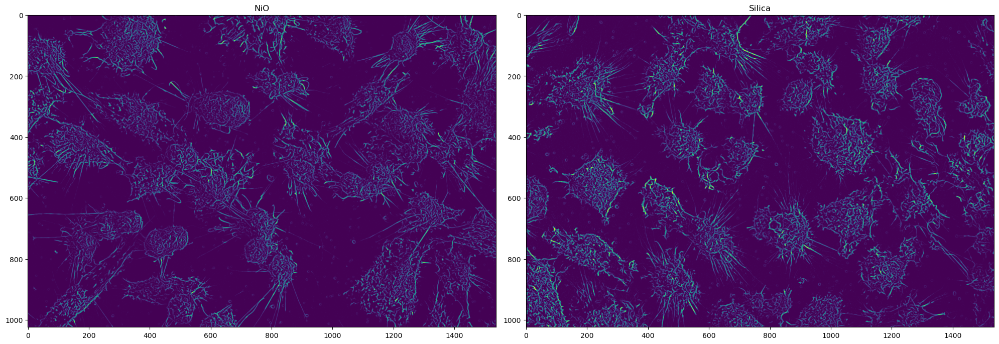

In [7]:

filters = skimage.filters.frangi(image, sigmas = (0.5, 2, 0.5), alpha=1, beta=15, black_ridges=False)
filters_cs = skimage.filters.frangi(image_cs, sigmas = (0.5,2,0.5), alpha=1, beta=15, black_ridges=False)

fig, ax = plt.subplots(1,2,figsize=(20, 10))
ax[0].imshow(filters)
ax[0].set_title('NiO')

# Second subplot
ax[1].imshow(filters_cs)
ax[1].set_title('Silica')

plt.tight_layout()
plt.show()

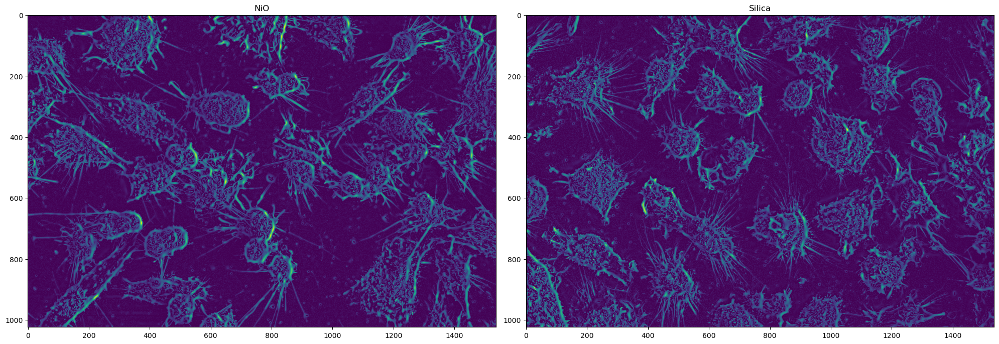

In [8]:
filters_meij = skimage.filters.meijering(image, sigmas=(1,5,2), black_ridges=False)
filters_cs_meij = skimage.filters.meijering(image_cs, sigmas=(1,5,2), black_ridges=False)

fig, ax = plt.subplots(1,2,figsize=(20, 10))
ax[0].imshow(filters_meij)
ax[0].set_title('NiO')

# Second subplot
ax[1].imshow(filters_cs_meij)
ax[1].set_title('Silica')

plt.tight_layout()
plt.show()

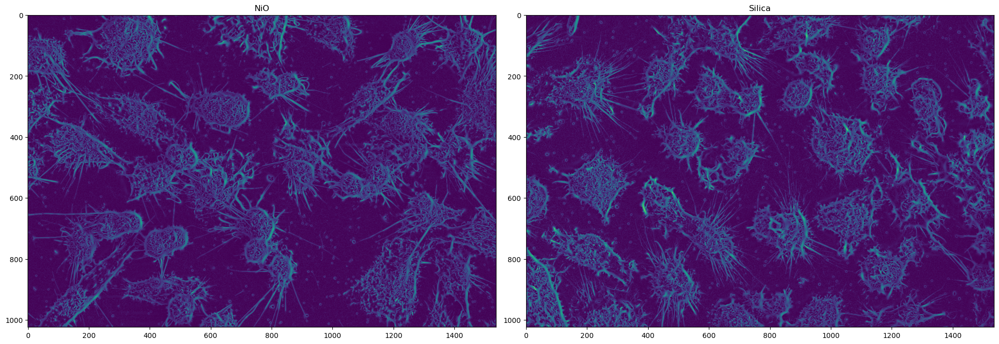

In [9]:
filters_meij = skimage.filters.sato(image, sigmas=(1,5,2), black_ridges=False)
filters_cs_meij = skimage.filters.sato(image_cs, sigmas=(1,5,2), black_ridges=False)

fig, ax = plt.subplots(1,2,figsize=(20, 10))
ax[0].imshow(filters_meij)
ax[0].set_title('NiO')

# Second subplot
ax[1].imshow(filters_cs_meij)
ax[1].set_title('Silica')

plt.tight_layout()
plt.show()

[[ 73.  30.  22. ...  44.  40.  37.]
 [ 61.  30.  19. ...  48.  48.  46.]
 [ 66.  33.  22. ...  53.  40.  45.]
 ...
 [ 41.  46.  43. ... 112. 106.  97.]
 [ 43.  39.  44. ... 105. 116.  91.]
 [ 38.  45.  37. ... 107. 110.  94.]]
(1024, 1536)
199


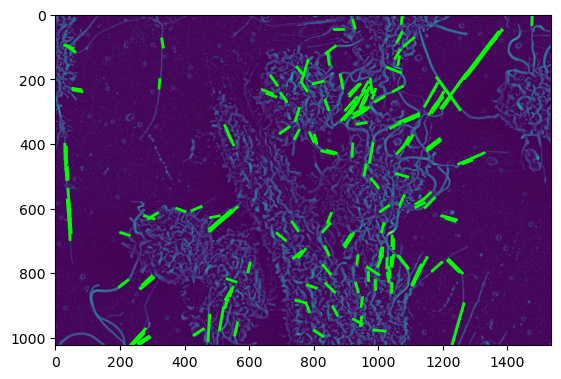

In [10]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import io, filters, morphology, feature, exposure
from scipy import ndimage as ndi


# Read the image
image_path = 'C:/Users/aksha/Peeples_Lab/SEM_Images_Lacunarity/Datasets/Lung Cells SEM Images_group1_DC_NEW/Lung Cells Exposed to Crystalline Silica (CS)/CS_Bottom of Insert_DC_02052021_5KV_2500_ETD-HV_10.png'
image_edges = Image.open(image_path)
image_edges = np.array(image_edges)
image_edges = (image_edges/image_edges.max())*255
image_blur = gaussian(image_edges, sigma=1, mode="reflect")
print(image_edges)


# Apply Meijering filter
meijering = filters.meijering(image_edges, sigmas=(1,5,2), black_ridges=False)
print(meijering.shape)

    
# Edge detection
edges = feature.canny(meijering, sigma=2)

# Detect lines using Probabilistic Hough Transform
lines = probabilistic_hough_line(edges, threshold=10, line_length=25,
                                    line_gap=3)
spike_count = 0
for line in lines:
    p0, p1 = line
    angle = np.abs(np.arctan2(p1[1] - p0[1], p1[0] - p0[0]) * 180. / np.pi)
    # Filter out horizontal and vertical lines
    if 5 < angle < 220:
        plt.plot((p0[0], p1[0]), (p0[1], p1[1]), c='lime', linewidth=2)
        spike_count += 1
print(spike_count)
plt.imshow(meijering)



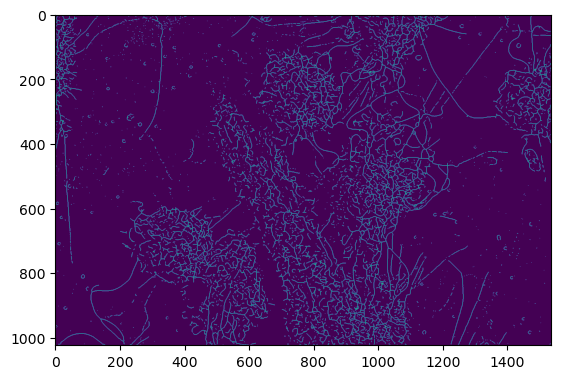

In [11]:
# Threshold the filtered image
binary = meijering > filters.threshold_otsu(meijering)


# Skeletonize the binary image
skeleton = morphology.skeletonize(binary)
plt.imshow(skeleton)
